# Working with SWOT Level 2 Water Mask Raster Image Data Product:
## Local Machine Download Version

#### *Author: Nicholas Tarpinian, PO.DAAC*

## Summary & Learning Objectives
### Notebook showcasing how to work with SWOT Raster Image data product version 2.0 on a local machine
- Utilizing the earthaccess Python package. For more information visit: https://nsidc.github.io/earthaccess/
- Option to query the new dataset based on users choice; choosing between two resolutions either by  '100m' or '250m'.
- Visualizing the dataset by choosing one of its various variables.
- Visualizing multiple raster images on a single map.
- Stacking multiple raster images and creating a time dimension to analyze over time.

## Requirements

### 1. Compute environment 

This tutorial is written to run in the following environment:
- **Local compute environment** e.g. laptop, server: this tutorial can be run on your local machine

### 2. Earthdata Login

An Earthdata Login account is required to access data, as well as discover restricted data, from the NASA Earthdata system. Thus, to access NASA data, you need Earthdata Login. Please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up. 


### Import libraries

In [1]:
%matplotlib inline

import os
import xarray as xr
import numpy as np
from datetime import datetime
from os.path import isfile, basename, abspath
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import display, Image, HTML
import hvplot
import hvplot.xarray 
import holoviews as hv
from holoviews import opts
import earthaccess
from earthaccess import Auth, DataCollections, DataGranules, Store

hv.extension('bokeh')

## Authentication with earthaccess

In this notebook, we will be calling the authentication in the below cell.

In [2]:
auth = earthaccess.login(strategy="interactive", persist=True)

### Search using `earthaccess` for SWOT Raster products
Each dataset has it's own unique collection concept ID. For the SWOT_L2_HR_Raster_2.0 dataset, we can find the collection ID [here](https://podaac.jpl.nasa.gov/dataset/SWOT_L2_HR_Raster_2.0).

For this tutorial, we are looking at the Lake Mead Reservoir.

We used [bbox finder](http://bboxfinder.com/) to get the exact coordinates for our area of interest.

In [3]:
results = earthaccess.search_data(
    short_name = 'SWOT_L2_HR_RASTER_2.0',
    bounding_box=(-115.112686,35.740939,-114.224167,36.937819),
    temporal =('2024-01-01 00:00:00', '2024-01-05 23:59:59'),
    granule_name = '*_100m_*',
    count =200
)

Granules found: 2


In [4]:
earthaccess.download(results, "./SWOT_Raster_LakeMead")

 Getting 2 granules, approx download size: 0.06 GB


QUEUEING TASKS | :   0%|          | 0/2 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/2 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/2 [00:00<?, ?it/s]

['SWOT_Raster_LakeMead\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_008_511_109F_20240101T124328_20240101T124347_PIC0_01.nc',
 'SWOT_Raster_LakeMead\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_008_511_110F_20240101T124346_20240101T124407_PIC0_01.nc']

### Visualizing the Dataset

Let's now visualize an individual layer for a single file that was downloaded using Xarray to read the NetCDF image.

In [5]:
file_paths = ('./SWOT_Raster_LakeMead/SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_008_511_109F_20240101T124328_20240101T124347_PIC0_01.nc')

In [6]:
dataset = xr.open_dataset(file_paths)

In [7]:
dataset.wse.hvplot.image(y='y', x='x').opts(width=1000, height=600, colorbar=True)

:Image   [x,y]   (wse)

### Visualizing Multiple Images

Let's now visualize multiple raster images in a folder and explore the data.

Utilizing [xarray.open_mfdataset](https://docs.xarray.dev/en/stable/generated/xarray.open_mfdataset.html) which supports the opening of multiple files.

In [8]:
folder_path = "./SWOT_Raster_LakeMead/"

file_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.nc')]

In [9]:
ds = xr.open_mfdataset(file_paths, combine='nested', concat_dim='x')
ds

<xarray.Dataset>
Dimensions:                  (y: 2760, x: 3009)
Coordinates:
  * y                        (y) float64 3.9e+06 3.9e+06 ... 4.176e+06 4.176e+06
  * x                        (x) float64 5.683e+05 5.684e+05 ... 7.435e+05
Data variables: (12/39)
    crs                      (x) object b'1' b'1' b'1' b'1' ... b'1' b'1' b'1'
    longitude                (y, x) float64 dask.array<chunksize=(502, 502), meta=np.ndarray>
    latitude                 (y, x) float64 dask.array<chunksize=(502, 502), meta=np.ndarray>
    wse                      (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
    wse_qual                 (y, x) float32 dask.array<chunksize=(2760, 1504), meta=np.ndarray>
    wse_qual_bitwise         (y, x) float64 dask.array<chunksize=(752, 752), meta=np.ndarray>
    ...                       ...
    load_tide_fes            (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
    load_tide_got            (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
    pole_tide                (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
    model_dry_tropo_cor      (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
    model_wet_tropo_cor      (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
    iono_cor_gim_ka          (y, x) float32 dask.array<chunksize=(752, 752), meta=np.ndarray>
Attributes: (12/49)
    Conventions:                   CF-1.7
    title:                         Level 2 KaRIn High Rate Raster Data Product
    source:                        Ka-band radar interferometer
    history:                       2024-01-05T11:01:19Z : Creation
    platform:                      SWOT
    references:                    V1.1.1
    ...                            ...
    x_min:                         568300.0
    x_max:                         718600.0
    y_min:                         3900200.0
    y_max:                         4050500.0
    institution:                   CNES
    product_version:               01

In [10]:
# Lisiting all available variables to select and visualize.
variables = list(ds.data_vars)

print("Variables within the NetCDF file:")
for variable in variables:
    print(variable)

Variables within the NetCDF file:
crs
longitude
latitude
wse
wse_qual
wse_qual_bitwise
wse_uncert
water_area
water_area_qual
water_area_qual_bitwise
water_area_uncert
water_frac
water_frac_uncert
sig0
sig0_qual
sig0_qual_bitwise
sig0_uncert
inc
cross_track
illumination_time
illumination_time_tai
n_wse_pix
n_water_area_pix
n_sig0_pix
n_other_pix
dark_frac
ice_clim_flag
ice_dyn_flag
layover_impact
sig0_cor_atmos_model
height_cor_xover
geoid
solid_earth_tide
load_tide_fes
load_tide_got
pole_tide
model_dry_tropo_cor
model_wet_tropo_cor
iono_cor_gim_ka


In [11]:
variable_name = 'wse'

variable_to_plot = ds[variable_name]

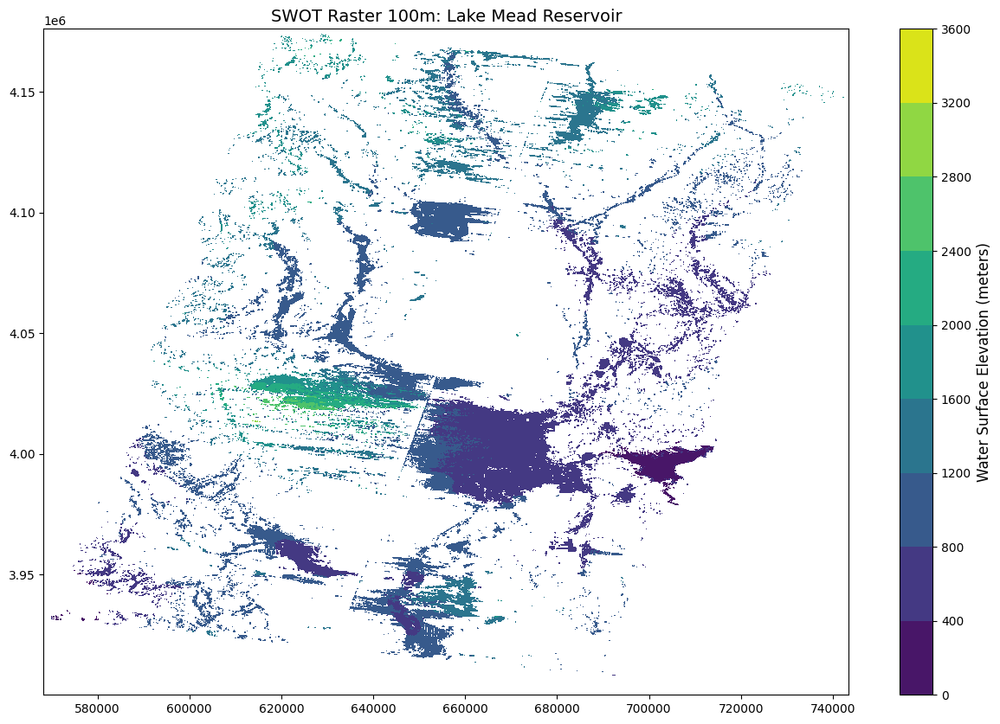

In [12]:
fig, ax = plt.subplots(figsize=(15, 10))
contour = ax.contourf(variable_to_plot['x'], variable_to_plot['y'], variable_to_plot, cmap='viridis')
cbar = plt.colorbar(contour)
cbar.set_label('Water Surface Elevation (meters)', fontsize=12)
ax.set_title('SWOT Raster 100m: Lake Mead Reservoir', fontsize=14)

plt.show()

In [13]:
raster_plot = ds.wse.hvplot.quadmesh(x='x', y='y', rasterize=True, title=f'SWOT Raster 100m: Lake Mead Reservoir')

raster_plot.opts(width=1000, height=600, colorbar=True)

:DynamicMap   []
   :Image   [x,y]   (wse)

### Creating a Time Series 

SWOT Raster product does not include a time dimension, but it can be inserted by extracting from the file naming convention. 

1. Expand the time range of your earthaccess search to get an adequate range.
2. Extracting the datetime from the file naming convention then concatenating based on the new time dimension.
3. Save the output as a new NetCDF file. 

In [14]:
time_results = earthaccess.search_data(
    short_name = 'SWOT_L2_HR_RASTER_2.0',
    bounding_box=(-114.502048,36.060175,-114.390983,36.210182),
    temporal =('2023-12-01 00:00:00', '2024-02-15 23:59:59'),
    granule_name = '*_100m_*',
    count =200
)

Granules found: 7


In [15]:
earthaccess.download(time_results, "./SWOT_Raster_LakeMead_Time")

 Getting 7 granules, approx download size: 0.29 GB


QUEUEING TASKS | :   0%|          | 0/7 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/7 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/7 [00:00<?, ?it/s]

['SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_007_496_046F_20231211T024534_20231211T024555_PIC0_01.nc',
 'SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_008_205_109F_20231221T142037_20231221T142058_PIC0_01.nc',
 'SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_008_496_046F_20231231T233040_20231231T233101_PIC0_01.nc',
 'SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_009_205_109F_20240111T110542_20240111T110603_PIC0_01.nc',
 'SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_009_496_046F_20240121T201546_20240121T201607_PIC0_01.nc',
 'SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_010_205_109F_20240201T075048_20240201T075109_PIC0_01.nc',
 'SWOT_Raster_LakeMead_Time\\SWOT_L2_HR_Raster_100m_UTM11S_N_x_x_x_010_496_046F_20240211T170050_20240211T170111_PIC0_01.nc']

In [16]:
folder_path = "./SWOT_Raster_LakeMead_Time"
file_paths = [os.path.join(folder_path, file) for file in os.listdir(folder_path) if file.endswith('.nc')]

In [17]:
def add_time_dimension(ds):
    # Extract date/time string from filename
    file_date = os.path.basename(ds.encoding['source']).split("_")[-4][:15]
    # Convert the date string to a datetime object
    time_value = datetime.strptime(file_date, "%Y%m%dT%H%M%S")
    # Assign the time coordinate to the dataset
    ds.coords['time'] = time_value
    return ds

In [18]:
datasets = []
file_names = []

In [19]:
for file_path in file_paths:
    dataset = xr.open_dataset(file_path)
    datasets.append(add_time_dimension(dataset))
    file_names.append(os.path.basename(file_path))
    dataset.close()

In [20]:
# sorting the time dimension in correct order
datasets.sort(key=lambda ds: ds.time.values)

In [21]:
result_dataset = xr.concat(datasets, dim='time')
result_dataset

<xarray.Dataset>
Dimensions:                  (x: 1549, y: 1549, time: 7)
Coordinates:
  * x                        (x) float64 6.788e+05 6.789e+05 ... 8.336e+05
  * y                        (y) float64 3.9e+06 3.901e+06 ... 4.055e+06
  * time                     (time) datetime64[ns] 2023-12-11T02:45:34 ... 20...
Data variables: (12/39)
    crs                      (time) object b'1' b'1' b'1' b'1' b'1' b'1' b'1'
    longitude                (time, y, x) float64 nan nan nan ... nan nan nan
    latitude                 (time, y, x) float64 nan nan nan ... nan nan nan
    wse                      (time, y, x) float32 nan nan nan ... nan nan nan
    wse_qual                 (time, y, x) float32 3.0 3.0 3.0 ... 3.0 3.0 3.0
    wse_qual_bitwise         (time, y, x) float64 8.053e+08 ... 8.053e+08
    ...                       ...
    load_tide_fes            (time, y, x) float32 nan nan nan ... nan nan nan
    load_tide_got            (time, y, x) float32 nan nan nan ... nan nan nan
    pole_tide                (time, y, x) float32 nan nan nan ... nan nan nan
    model_dry_tropo_cor      (time, y, x) float32 nan nan nan ... nan nan nan
    model_wet_tropo_cor      (time, y, x) float32 nan nan nan ... nan nan nan
    iono_cor_gim_ka          (time, y, x) float32 nan nan nan ... nan nan nan
Attributes: (12/49)
    Conventions:                   CF-1.7
    title:                         Level 2 KaRIn High Rate Raster Data Product
    source:                        Ka-band radar interferometer
    history:                       2023-12-15T16:15:45Z : Creation
    platform:                      SWOT
    references:                    V1.1.1
    ...                            ...
    x_min:                         678800.0
    x_max:                         833600.0
    y_min:                         3900500.0
    y_max:                         4055300.0
    institution:                   CNES
    product_version:               01

In [22]:
ds2 = result_dataset

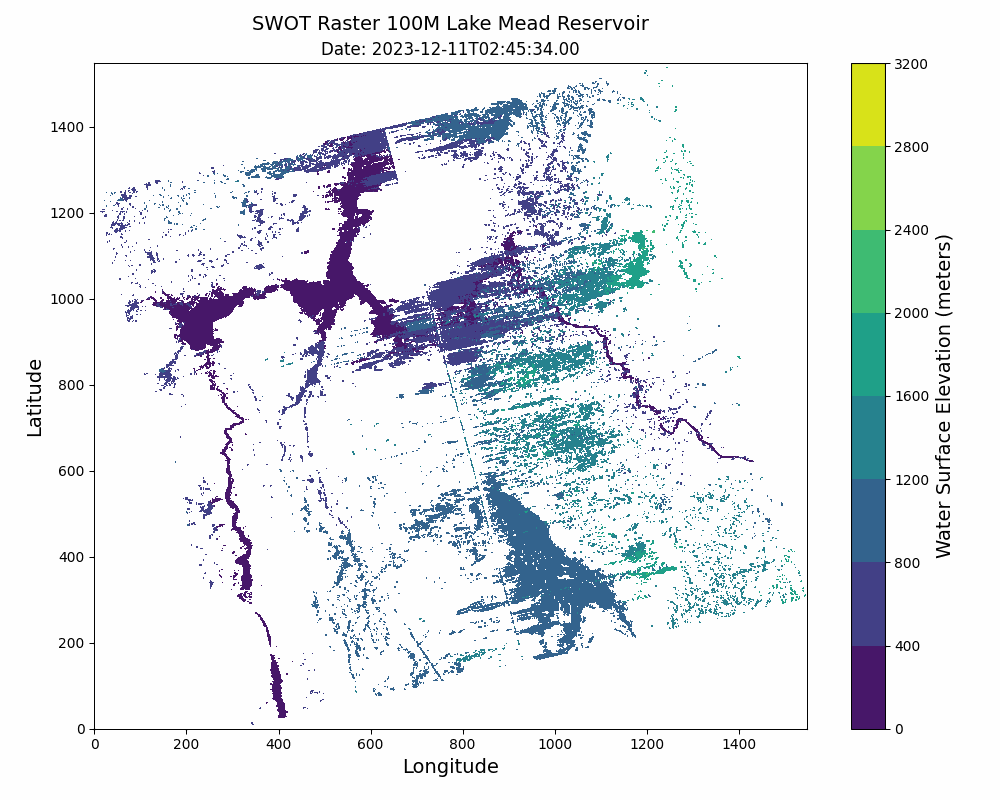

In [23]:
variable_name = 'wse'
data = ds2[variable_name]

fig, ax = plt.subplots(figsize=(10, 8))
fig.set_tight_layout({'rect': [0.01, 0.01, 1.0, 1.0]})

contour = ax.contourf(data.isel(time=0), cmap='viridis')
cbar = plt.colorbar(contour)
cbar.set_label('Water Surface Elevation (meters)', fontsize=14) 
times = ds2.time.values

# Function to update the plot for each time step
def update(frame):
    ax.clear()
    contour = ax.contourf(data.isel(time=frame), cmap='viridis',)
    formatted_time = str(times[frame])[:-7]
    ax.set_title(f'Date: {formatted_time}')
    ax.set_xlabel('Longitude', fontsize=14)
    ax.set_ylabel('Latitude', fontsize=14)
    ax.text(0.5, 1.05, 'SWOT Raster 100M Lake Mead Reservoir', transform=ax.transAxes, ha='center', fontsize=14)
    return contour,

# Creating a gif animation
ani = animation.FuncAnimation(fig, update, repeat=True, frames=len(data['time']), blit=True, interval=3000)

output = ('./time_series.gif')
ani.save(output, writer='pillow', fps=.5)

with open(output,'rb') as f:
    display(Image(data=f.read(), format='gif'))

plt.close(fig)
ds2.close()

### We can also save the time series to a new netcdf file. 

In [24]:
output_folder = './SWOT_Raster_Time'
os.makedirs(output_folder, exist_ok=True)

In [25]:
output_netcdf_path = os.path.join(output_folder, "Output_Time.nc")
result_dataset.to_netcdf(output_netcdf_path)

print(f"Output complete: {output_netcdf_path}")

Output complete: ./SWOT_Raster_Time\Output_Time.nc
